In [8]:
# database connection library + database information
from db_configs import host, database, user, password
import psycopg2 as pg

# data manipulation libraries
import pandas as pd
import geopandas as gpd 
from shapely.geometry import Point # convert coordinates to points
import numpy as np
from datetime import datetime
from scipy.spatial import Voronoi, voronoi_plot_2d
import shapely as sp

# data visualization libraries
import plotly.graph_objs as go
import plotly
#import cufflinks as cf # Cufflinks binds plotly to pandas dataframes in IPython notebook.
import matplotlib.pyplot as plt
import seaborn as sns # for color palettes

#cf.set_config_file(offline=False, world_readable=True, theme='pearl')

# to create visualizations gifs
import glob
import os

# Turn on retina mode and set configurations
from IPython.display import set_matplotlib_formats
import IPython

set_matplotlib_formats('retina')
%matplotlib inline
plotly.offline.init_notebook_mode()
import warnings
warnings.simplefilter(action="ignore", category=FutureWarning)

# connect to the database
connection = pg.connect(host=host, dbname=database, user=user, password=password)

viz_out = 'viz/'
data_dir = 'data/'

top_visiting_countries = ['France', 'Spain', 'United Kingdom', 'Germany', 'Netherlands', 'Switzerland', 'Luxembourg', 'Belgium', 'Italy', 'Poland', 'United States', 'China', 'Brazil', 'Russian Federation', 'Angola', 'Ireland']


## Some functions

In [7]:
def plotly_bar_chart(trace_data, x_col, y_col, title, save_dir, bar_color="rgb(151, 160, 160)", xaxis_title=None, yaxis_title=None, display=False, bottom_margin=None, right_margin=None):

    trace1 = {
      "x": trace_data[x_col],
      "y": trace_data[y_col], 
      "marker": {"color": bar_color}, 
      "name": title, 
      "type": "bar", 
      "uid": "247a10"#, 
      #"text": ["Relative Frequency: "+str("{0:.2f}".format(nbr))+'%' for nbr in trace_data['%_tourists']]
    }
    data = go.Data([trace1])
    layout = {
      "margin": {"b":bottom_margin, "r":right_margin},
      "autosize": True, 
      "dragmode": "lasso", 
      "hovermode": "x", 
      "title": title, 
      "xaxis": {
        "autorange": True, 
        #"range": [-0.5, 56.5], 
        "showspikes": False, 
        "title": xaxis_title, 
        "type": "category"
      }, 
      "yaxis": {
        "autorange": True, 
        #"range": [0, 106.383682389], 
        "showspikes": False, 
        "title": yaxis_title, 
        "type": "linear"
      }
    }
    
    fig = go.Figure(data=data, layout=layout)
    plotly.offline.plot(fig, filename=save_dir, show_link=False, auto_open=False)
    if display:
        plotly.offline.iplot(fig, show_link=False)


## Making the visualizations and editing data

In [6]:
# # de distritos visitados por nacionalidade
df = pd.read_sql_query('select * from telecom_pt.viz_final_visited_distritos_per_origin', con=connection)
df = df[df['country_of_origin'].isin(top_visiting_countries)].sort_values('avg', ascending=False)

plotly_bar_chart(df, 
                 x_col='country_of_origin', 
                 y_col='avg', 
                 title='Number of Visited Districts per Nationality', 
                 save_dir=viz_out+'numero_de_distritos_visitados_por_origem.html',
                 xaxis_title='Country of Origin', 
                 yaxis_title='Average Number of Districts',
                 bottom_margin=100
                )

df.to_csv(data_dir+'numero_de_distritos_visitados_por_origem.csv',index=False)

del df

/opt/anaconda/anaconda3/lib/python3.7/site-packages/plotly/graph_objs/_deprecations.py:39: DeprecationWarning:

plotly.graph_objs.Data is deprecated.
Please replace it with a list or tuple of instances of the following types
  - plotly.graph_objs.Scatter
  - plotly.graph_objs.Bar
  - plotly.graph_objs.Area
  - plotly.graph_objs.Histogram
  - etc.




In [7]:
# POI com # de visitantes
df = pd.read_sql_query('select * from telecom_pt.viz_final_poi_number_visits', con=connection)
df = df[~df['poi'].isnull()].sort_values('count', ascending=False)

df.to_csv(data_dir+'poi_com_numero_de_visitantes.csv',index=False)

df = df.nlargest(20, 'count')

plotly_bar_chart(df, 
                 x_col='poi', 
                 y_col='count', 
                 title='Number of Visiting Roamers to the Most Visited POI\'s', 
                 save_dir=viz_out+'poi_com_numero_de_visitantes.html',
                 xaxis_title='POI', 
                 yaxis_title='Number of visiting roamers',
                 bottom_margin=200,
                 right_margin=120
                )

del df

/opt/anaconda/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:715: UserWarning:

Using the barplot function without specifying `order` is likely to produce an incorrect plot.



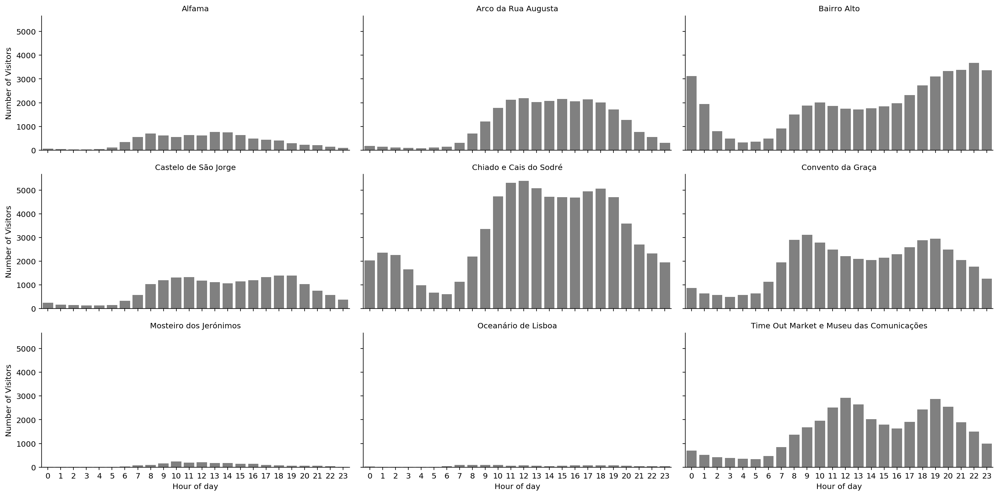

In [45]:
# POI com horas mais visitadas
set_matplotlib_formats('retina')
%matplotlib inline

df = pd.read_sql_query('select * from telecom_pt.pre_final_visitation_hours', con=connection)
df = df[~df['poi'].isnull()]
df['hour_of_day'] = df['hour_of_day'].astype(int)
df = df.rename(columns={'hour_of_day': 'Hour of day', 'n_visitors': 'Number of Visitors'})

pois_lisboa = [
    'Museu-Escola de Artes Decorativas Portuguesas',
    'Mosteiro dos Jerónimos',
    'Oceanário de Lisboa',
    'Arco da Rua Augusta',
    'Igreja do Loreto - Lisboa',
    'Castelo de São Jorge ',
    'Convento da Graça em Lisboa',
    'Museu Nacional de Arte Contemporânea - Museu do Chiado',
    'Museu das Comunicações'
]

df_lisboa = df[df['poi'].isin(pois_lisboa)]
df_lisboa.poi = df_lisboa.poi.map({
    'Museu-Escola de Artes Decorativas Portuguesas':'Alfama',
    'Mosteiro dos Jerónimos':'Mosteiro dos Jerónimos',
    'Oceanário de Lisboa':'Oceanário de Lisboa',
    'Arco da Rua Augusta':'Arco da Rua Augusta',
    'Igreja do Loreto - Lisboa':'Bairro Alto',
    'Castelo de São Jorge ':'Castelo de São Jorge',
    'Convento da Graça em Lisboa':'Convento da Graça',
    'Museu Nacional de Arte Contemporânea - Museu do Chiado':'Chiado e Cais do Sodré',
    'Museu das Comunicações':'Time Out Market e Museu das Comunicações'})

df_lisboa = df_lisboa.sort_values('poi')

p = sns.FacetGrid(df_lisboa, col="poi", col_wrap=3, aspect=2, height=3)
p.map(sns.barplot, 'Hour of day', 'Number of Visitors', color="gray").set_titles("{col_name}")
plt.savefig(viz_out+'poi_com_horas_mais_visitadas_lisboa.png', format='png', dpi=1200, transparent=True, bbox_inches='tight')
plt.show()
#df[df['poi'].str.contains('', regex=False)]
#del df


/opt/anaconda/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:715: UserWarning:

Using the barplot function without specifying `order` is likely to produce an incorrect plot.



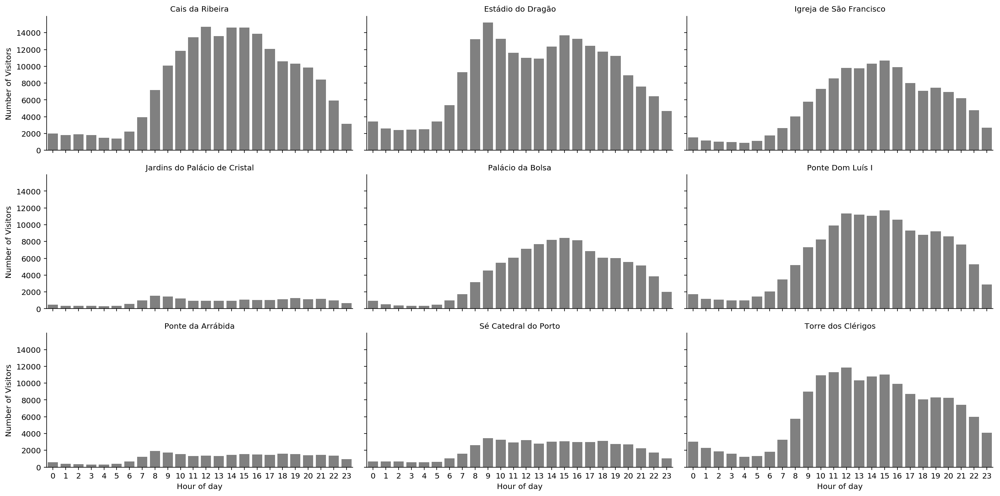

In [48]:

pois_porto = [
    'Torre dos Clérigos', #
    'Palácio da Bolsa', #
    'Igreja de São Francisco - Porto', #
    'Mosteiro da Serra do Pilar',
    'Igreja dos Grilos - Porto',
    'Sé Catedral do Porto',
    'Estádio do Dragão',
    'Torre do Palácio dos Terenas',
    'Faculdade de Arquitetura do Porto'
]


df_porto = df[df['poi'].isin(pois_porto)]
df_porto.poi = df_porto.poi.map({
    'Torre dos Clérigos':'Torre dos Clérigos',
    'Palácio da Bolsa':'Palácio da Bolsa',
    'Igreja de São Francisco - Porto':'Igreja de São Francisco',
    'Mosteiro da Serra do Pilar': 'Ponte Dom Luís I',
    'Igreja dos Grilos - Porto':'Cais da Ribeira',
    'Sé Catedral do Porto':'Sé Catedral do Porto',
    'Estádio do Dragão':'Estádio do Dragão',
    'Torre do Palácio dos Terenas':'Jardins do Palácio de Cristal',
    'Faculdade de Arquitetura do Porto':'Ponte da Arrábida'})

df_porto = df_porto.sort_values('poi')

p = sns.FacetGrid(df_porto, col="poi", col_wrap=3, aspect=2, height=3)
p.map(sns.barplot, 'Hour of day', 'Number of Visitors', color="gray").set_titles("{col_name}")



In [31]:
# POI com nacionalidades que mais visitam
df = pd.read_sql_query('select * from telecom_pt.viz_final_poi_most_visited_origins', con=connection)



df = df[(df.origin.isin(top_visiting_countries))&(~df.poi.isnull())].pivot(index='poi', columns='origin', values='n_visitors').fillna(0)

def percent_poi(row):
    total = sum(row)
    return (row/total)*100

df.apply(percent_poi, axis=1).to_csv(data_dir+'poi_com_nacionalidades_que_mais_visitam.csv')
#del df

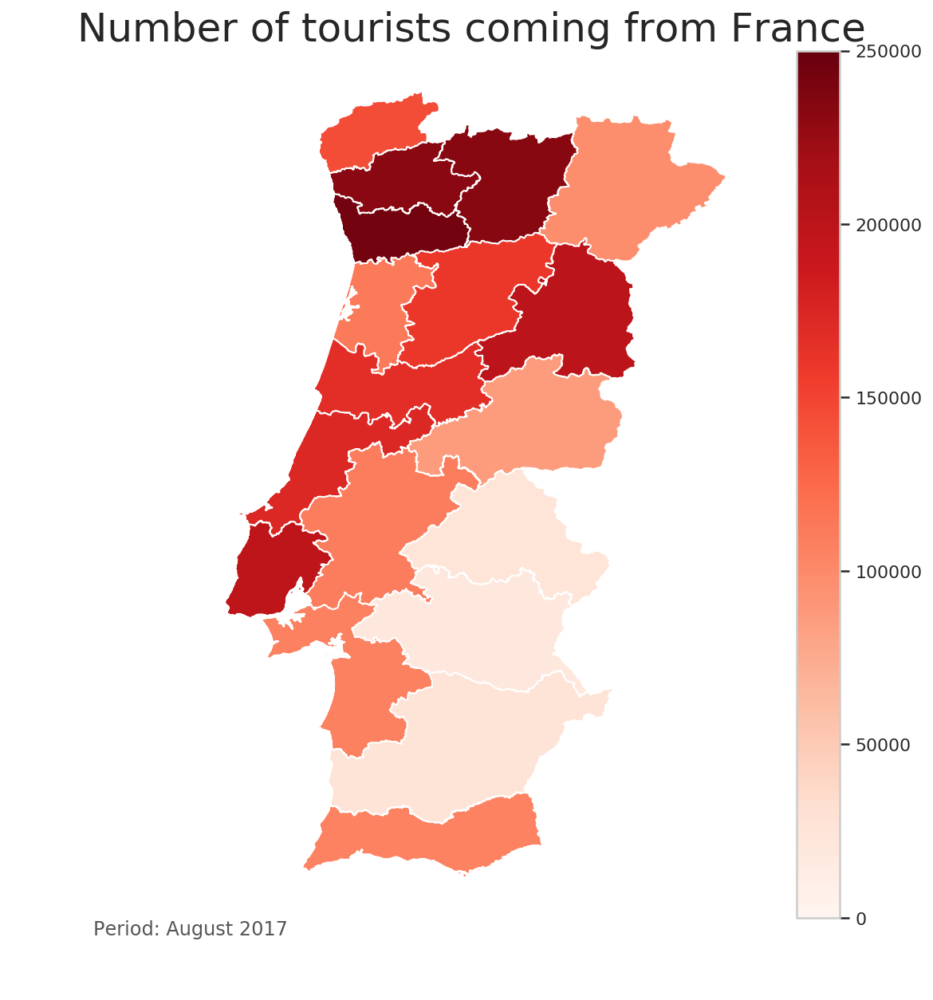

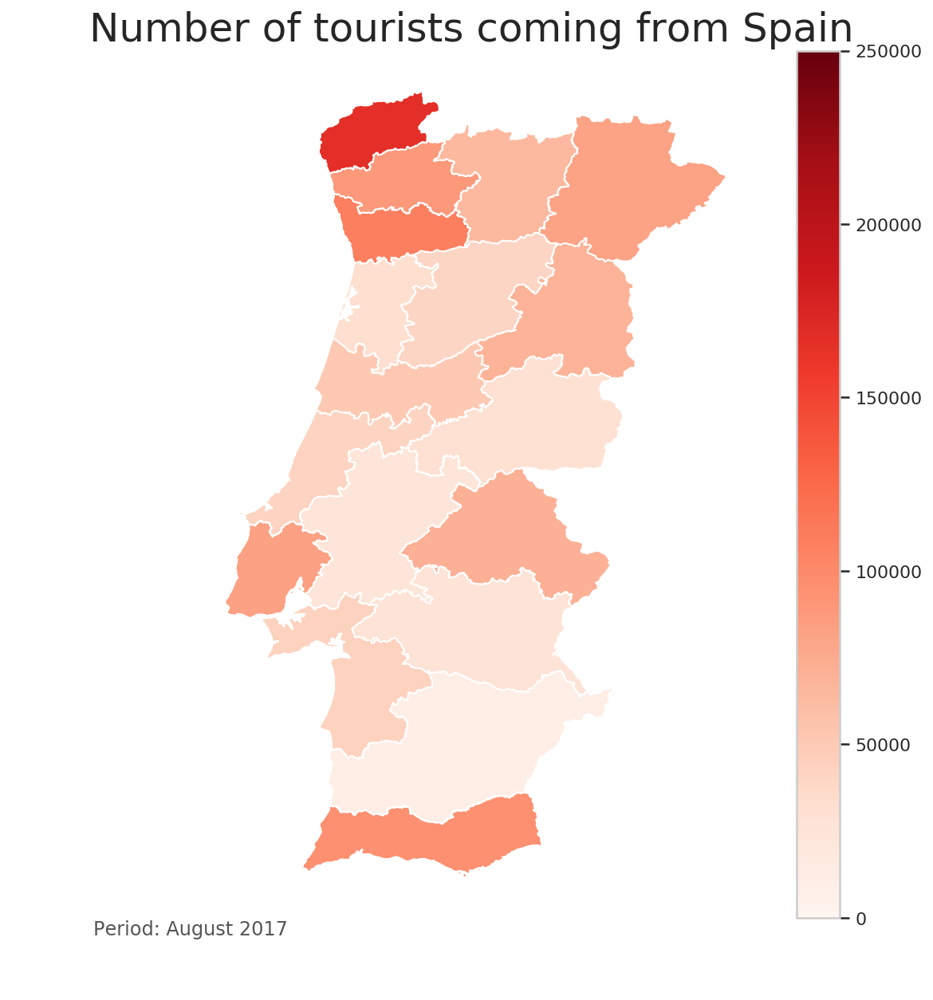

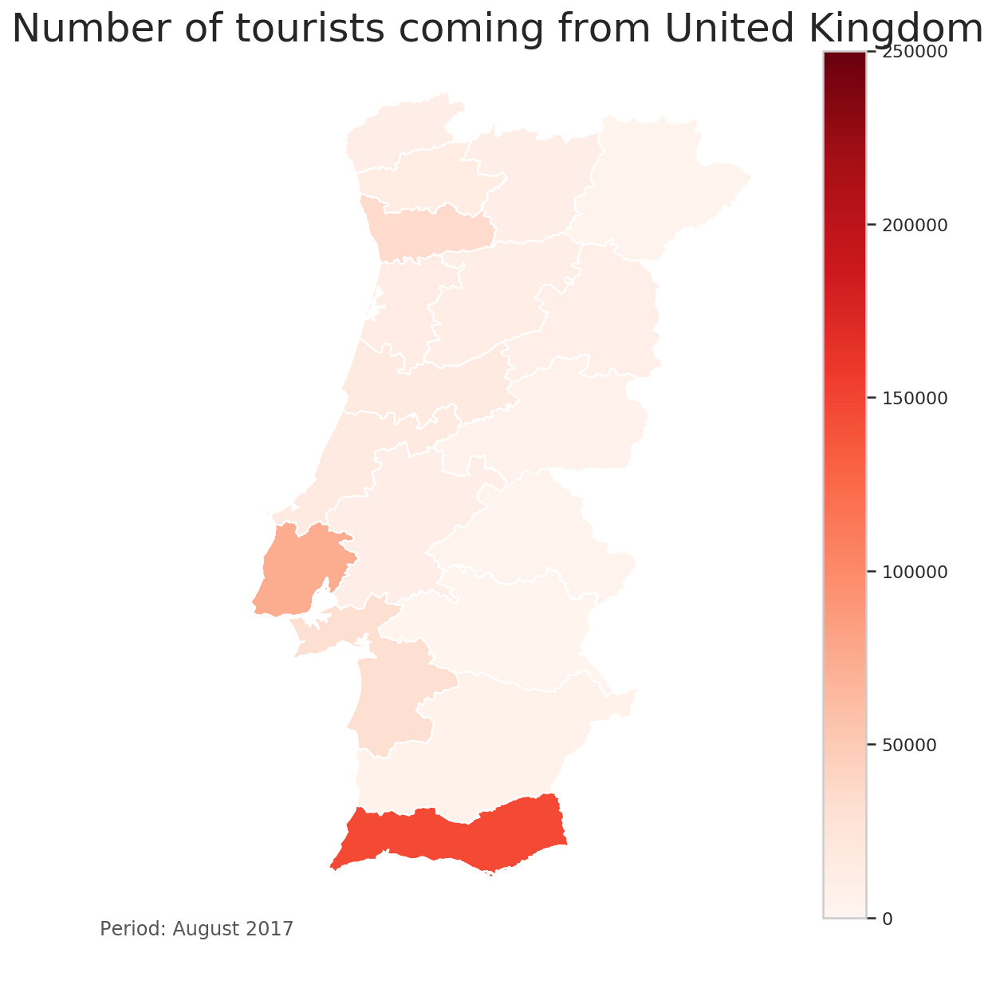

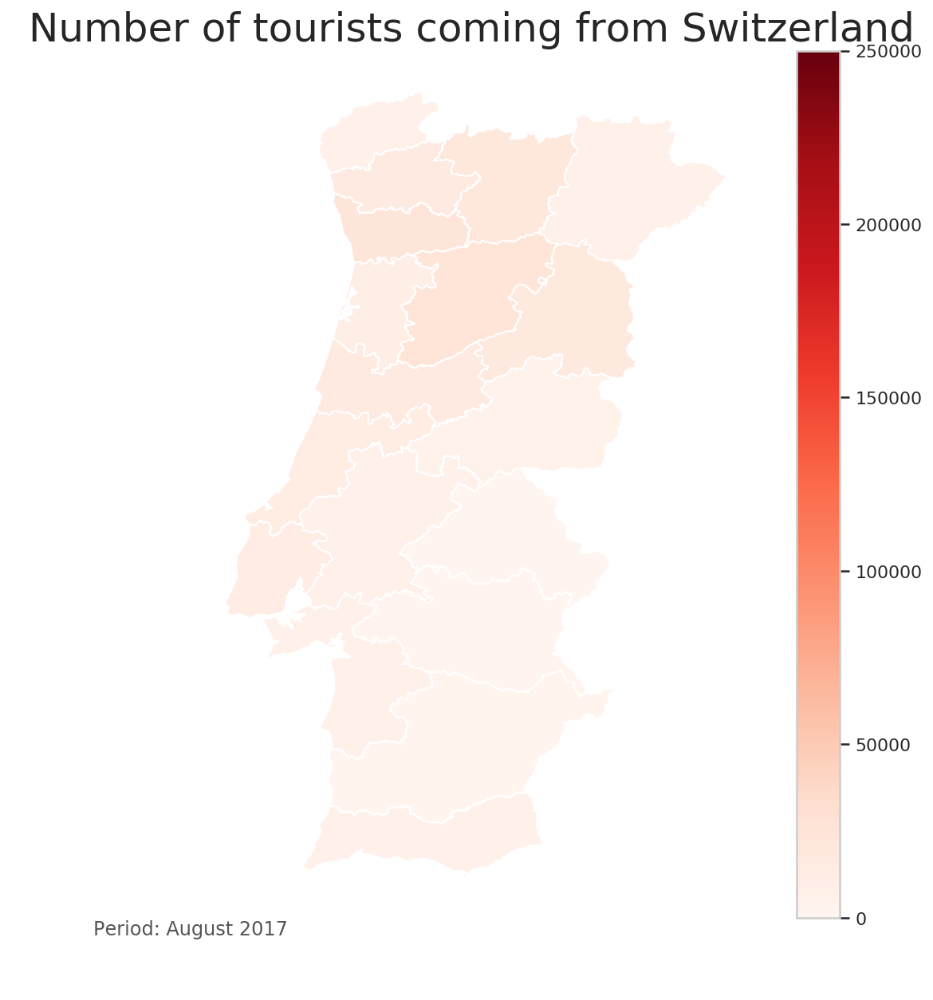

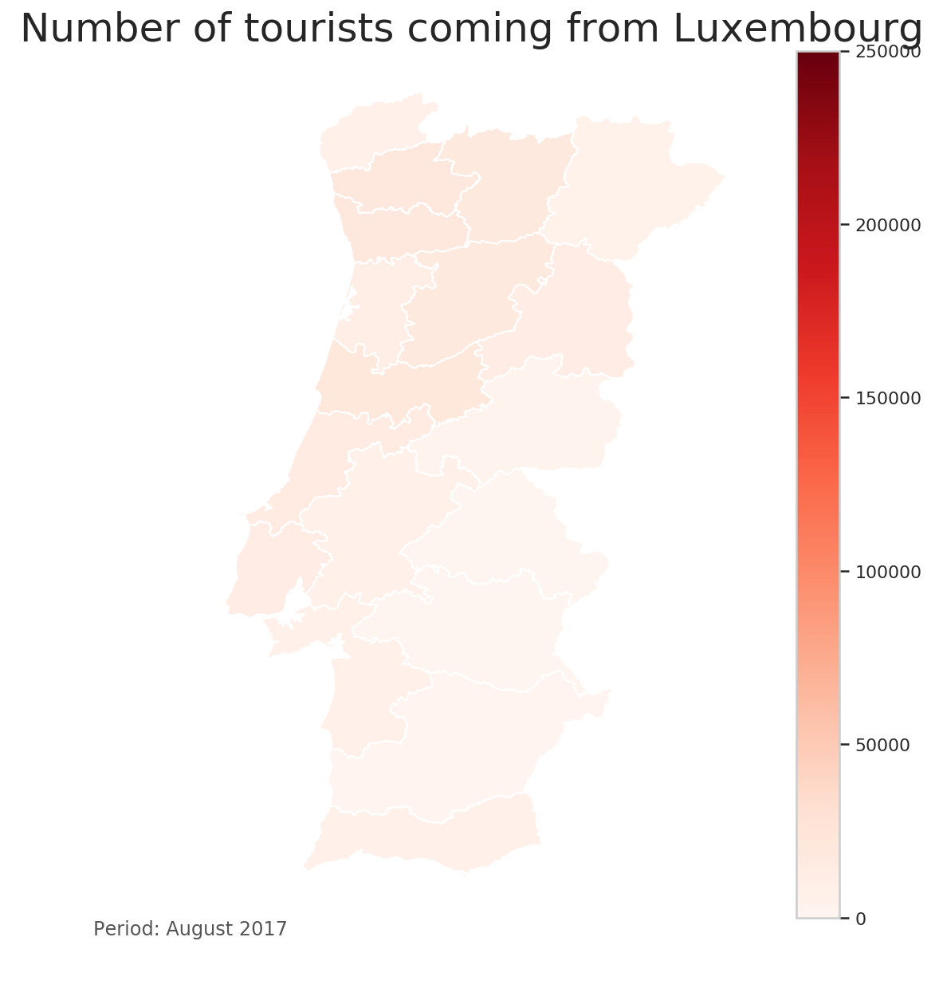

...

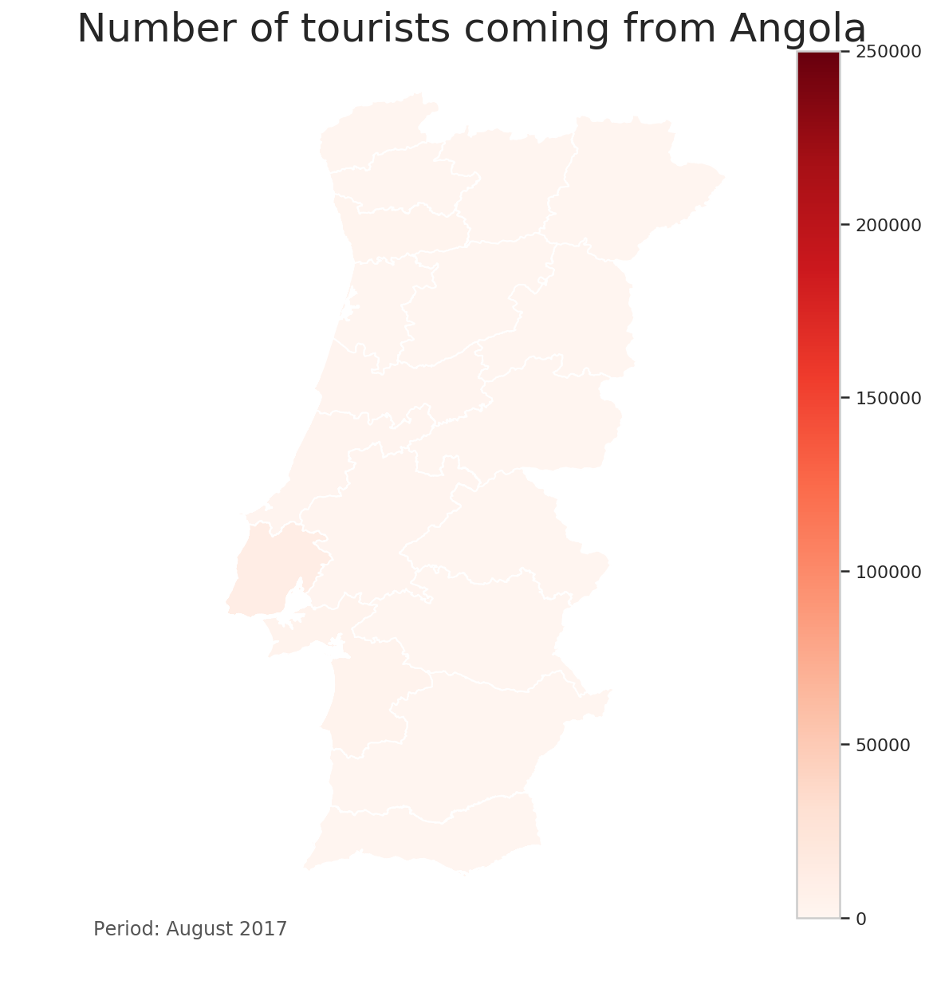

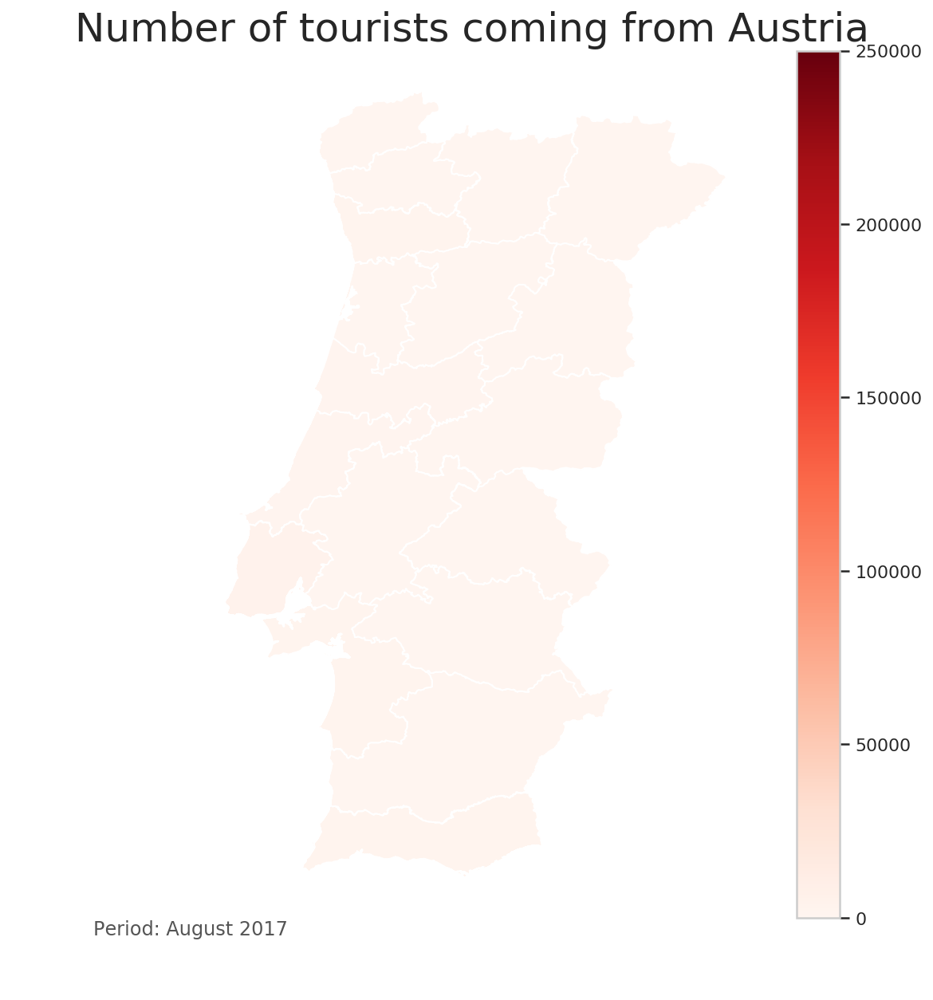

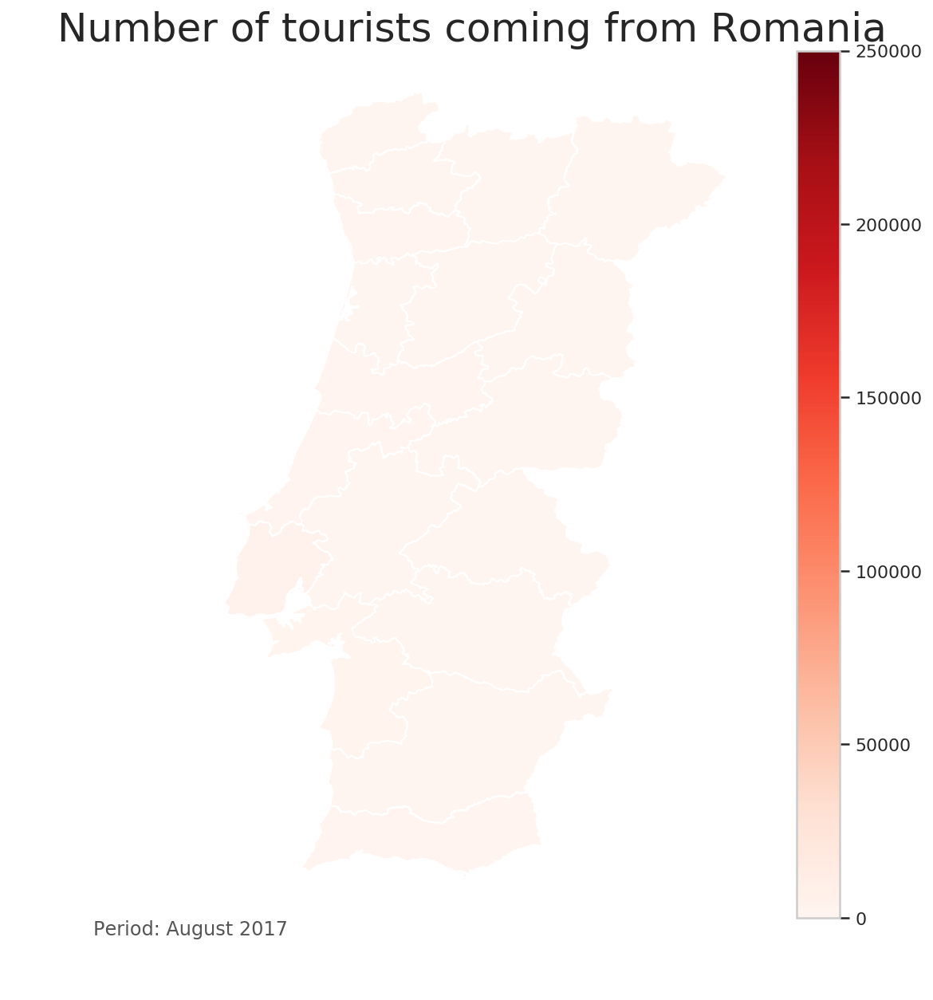

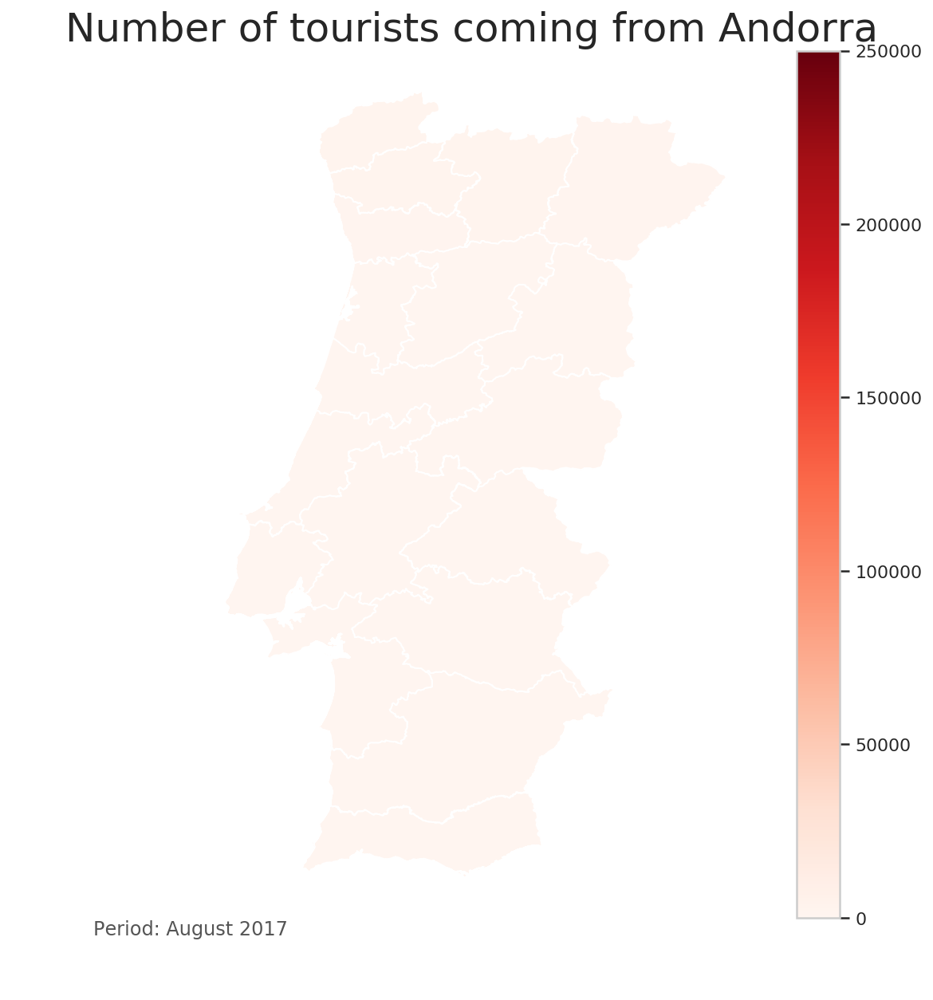

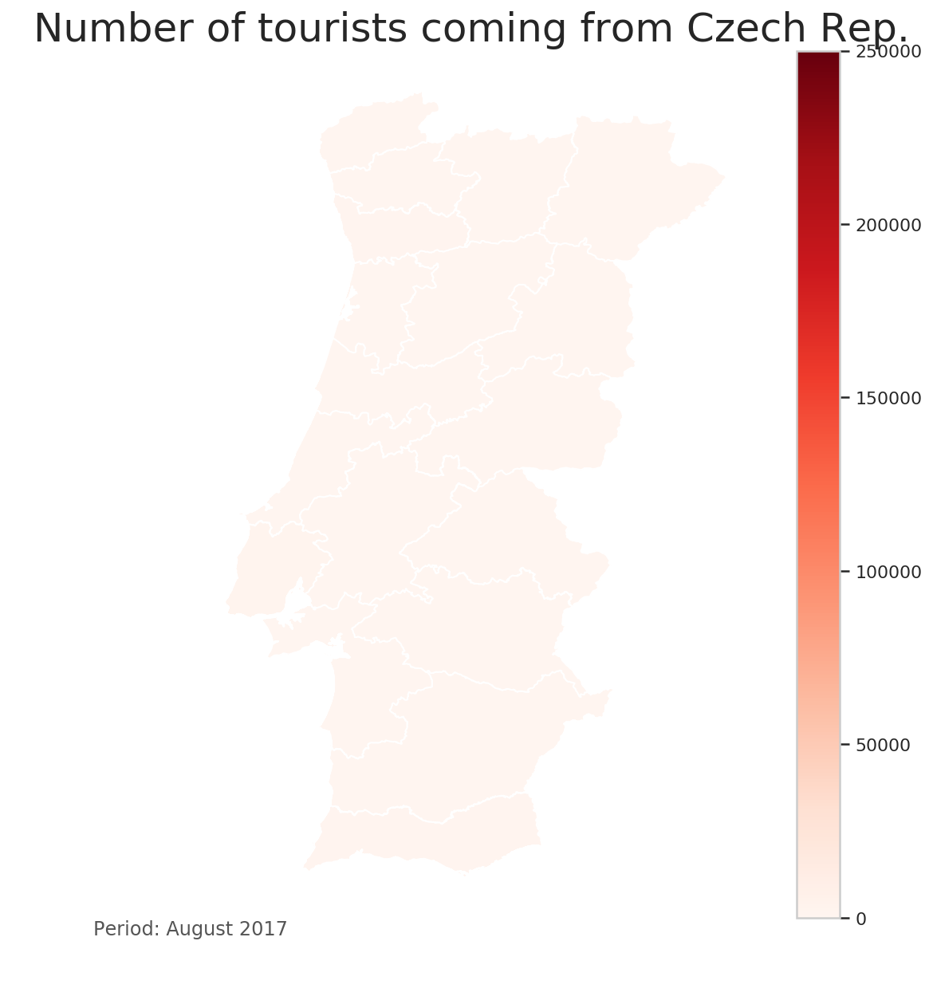

In [13]:
# # de turistas por distrito, dividido por nacionalidade

df = pd.read_sql_query('select * from telecom_pt.viz_final_tourists_per_district_per_nationality', con=connection)

# ------------------------------------------------------------------------------------------------------------------- #
# reading Portugal shapefile and selecting districts

shp_dir = '/home/jfonseca/tourism_management_proj/lisbon/pt_regions_shapefiles/'
portugal = gpd.read_file(shp_dir+'gadm36_PRT.gpkg')\
            .rename(columns={'NAME_0':'country','NAME_1':'distrito', 'NAME_2':'concelho', 'NAME_3':'municipio' })\
            [['country','distrito','concelho','municipio','geometry']]

distritos = portugal[['distrito', 'geometry']].dissolve(by='distrito').reset_index()
distritos = distritos[~distritos['distrito'].isin(['Azores','Madeira'])]
# ------------------------------------------------------------------------------------------------------------------- #
set_matplotlib_formats('retina')
%matplotlib inline

origins = list(df.groupby('origin').sum().nlargest(20, 'n_visitors').index.unique())

for origin in origins:
    pt_df  = df[df['origin']==origin]
    pt_map = distritos.merge(pt_df, on='distrito', how='left')

    ax = pt_map[['n_visitors', 'geometry']].plot(column='n_visitors', 
                                                           cmap='Reds',
                                                           #edgecolor='0.0',
                                                           figsize=(10, 10),
                                                           legend=True,
                                                           vmin=0,
                                                           vmax=250000
                                                          )
    # set the range for the choropleth
    #vmin, vmax = 120, 220
    ax.set_title('Number of tourists coming from %s' % origin, fontdict={'fontsize': 25, 'fontweight' : 3})
    ax.annotate('Period: August 2017', xy=(0.1, .08),  xycoords='figure fraction', horizontalalignment='left', verticalalignment='top', fontsize=12, color='#555555')
    ax.axis('off')
    plt.savefig('viz/origin_per_district/%s_per_district.png' % origin, dpi='figure', quality=95, transparent=True)
    #plt.close()
    plt.show()


del df

In [12]:
pt_map.plot?

In [ ]:
pt_map[['n_visitors', 'geometry']].plot

In [ ]:
# Matriz com distritos visitados frequentemente (aka contingency table)
df = pd.read_sql_query('select * from telecom_pt.viz_final_frequently_visited_distritos', con=connection)

df = df[df['string_agg'].notnull()]

df['locations'] = df['string_agg'].apply(lambda x: x.split(', '))



c = list(distritos['distrito'].unique())
c.append('Azores')
c.append('Madeira')

res = pd.DataFrame(columns=c, index=c)
res = res.fillna(0)

def contingency_maker(val):
    for n in val:
        if len(val)>1:
            for l in val:
                res.loc[n,l]+=1
        else:
            res.loc[n,n]+=1
            
df['locations'].apply(contingency_maker)

#del df

res.to_csv('data/contingency_table.csv')

res

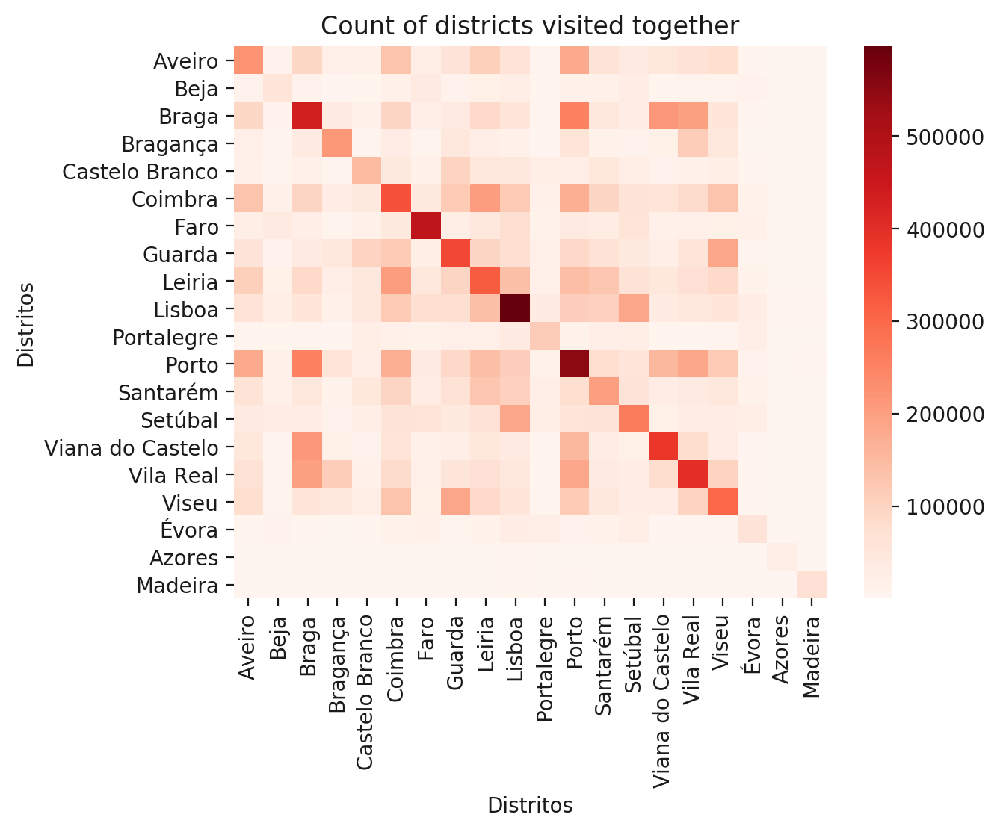

In [161]:
# contingency table part 2

contingency = pd.read_csv('data/contingency_table.csv').rename(columns={'Unnamed: 0':'Distritos'}).set_index('Distritos')

sns.reset_defaults()
#sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.heatmap(contingency, cmap='Reds')
plt.title('Count of districts visited together')
plt.xlabel('Distritos')
plt.savefig(viz_out+'contingency_table.png', format='png', dpi=1200, transparent=True, bbox_inches='tight')
plt.show()


/opt/anaconda/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



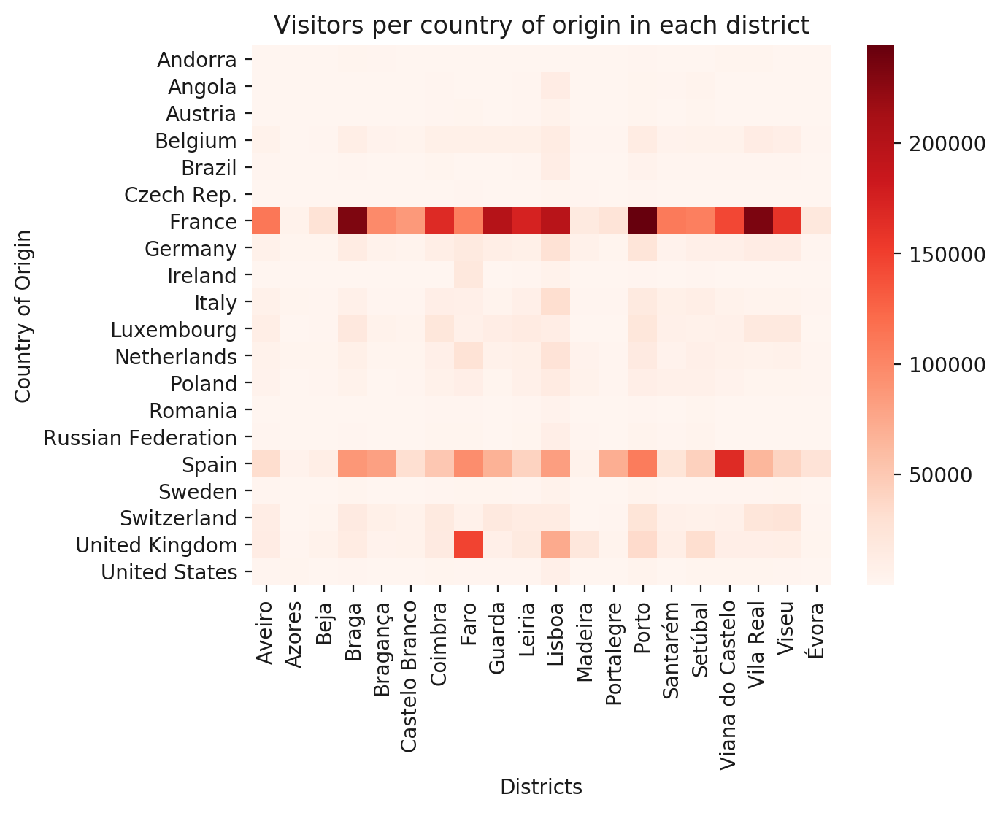

In [176]:
# % de nacionalidades por distrito (Fazer em Python usando viz_final_tourists_per_district_per_nationality)
df = pd.read_sql_query('select * from telecom_pt.viz_final_tourists_per_district_per_nationality', con=connection)

#df = df[~df.origin.isin(['France'])]
pv = df[df.origin.isin(origins)][~df.distrito.isnull()].pivot(index='origin', columns='distrito', values='n_visitors')

sns.heatmap(pv, cmap='Reds')
plt.title('Visitors per country of origin in each district')
plt.xlabel('Districts')
plt.ylabel('Country of Origin')
plt.savefig(viz_out+'visitors_per_country_of_origin_per_district.png', format='png', dpi=1200, transparent=True, bbox_inches='tight')
plt.show()


#del df

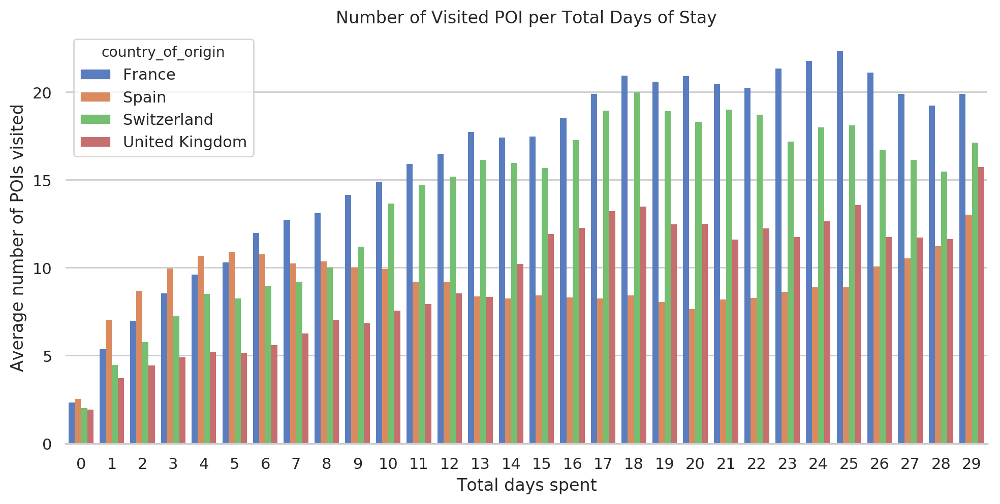

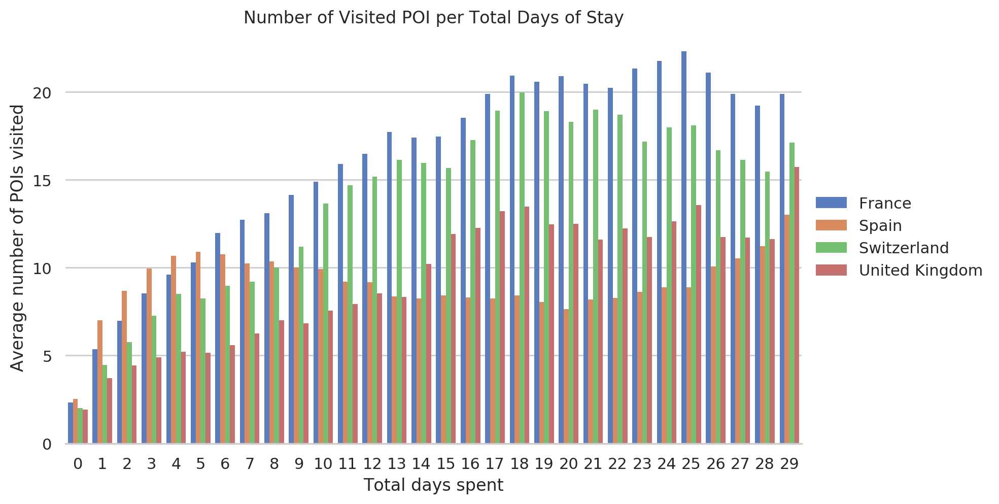

In [55]:
# # de POIS visitados por tempo de estadia e nacionalidade - viz_final_poi_visited_per_days_spent_and_origin
df = pd.read_sql_query('select * from telecom_pt.viz_final_poi_visited_per_days_spent_and_origin', con=connection)

df.days_spent = df.days_spent.astype(int)
df = df[df.country_of_origin.isin(origins[:4])]
pv = df.pivot(index='days_spent', columns='country_of_origin', values='avg')

#pv.plot.bar(rot=0)
sns.reset_defaults()
sns.set(rc={'figure.figsize':(11.7,5.27)})
sns.set(style="whitegrid")
ax = sns.barplot(x="days_spent", y="avg", hue="country_of_origin", data=df, palette='muted')
plt.setp(ax.patches, linewidth=0)
plt.xlabel('Total days spent')
plt.ylabel('Average number of POIs visited')
plt.title('Number of Visited POI per Total Days of Stay')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
#ax.legend(loc=5)
plt.savefig(viz_out+'visited_pois_per_days_of_stay_v1.png', format='png', dpi=1200, transparent=True, bbox_inches='tight')
plt.show()



sns.reset_defaults()
sns.set(rc={'figure.figsize':(11.7,5.27)})
sns.set(style="whitegrid")
ax = sns.barplot(x="days_spent", y="avg", hue="country_of_origin", data=df, palette='muted')
plt.setp(ax.patches, linewidth=0)
plt.xlabel('Total days spent')
plt.ylabel('Average number of POIs visited')
plt.title('Number of Visited POI per Total Days of Stay')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), frameon=False)
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
plt.savefig(viz_out+'visited_pois_per_days_of_stay_v2.png', format='png', dpi=1200, transparent=True, bbox_inches='tight')
plt.show()

#del df


In [61]:
# POIS com nacionalidades e horas que mais visitam
df = pd.read_sql_query('select * from telecom_pt.viz_final_poi_hours_visited_origins', con=connection)




#del df
df[~df.poi.isnull()].sort_values(['poi', 'origin', 'hour_of_day'], ascending=True)[df.poi=='Museu Nacional de Arte Contemporânea - Museu do Chiado']\
        [df.origin=='France']

/opt/anaconda/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/opt/anaconda/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



,poi,hour_of_day,origin,n_visitors,rank
216020,Museu Nacional de Arte Contemporânea - Museu d...,11.0,France,2551,4
216018,Museu Nacional de Arte Contemporânea - Museu d...,12.0,France,2620,2
216021,Museu Nacional de Arte Contemporânea - Museu d...,13.0,France,2523,5
216019,Museu Nacional de Arte Contemporânea - Museu d...,17.0,France,2590,3
216017,Museu Nacional de Arte Contemporânea - Museu d...,18.0,France,2664,1


In [30]:
# 10 POIS mais visitados, com ficha informativa (?)

In [ ]:
# POI + Nacionalidade + Horas
#popy_pois = pd.read_csv(data_dir+'poi_com_numero_de_visitantes.csv').nlargest(10, 'count').poi.to_list()

df = pd.read_sql_query('select * from telecom_pt.pre_final_visitation_hours', con=connection)
df = df[~df['poi'].isnull()]
df['hour_of_day'] = df['hour_of_day'].astype(int)
df = df.rename(columns={'hour_of_day': 'Hour of day', 'n_visitors': 'Number of Visitors'})


pois_lisboa = [
    'Museu-Escola de Artes Decorativas Portuguesas',
    'Mosteiro dos Jerónimos',
    'Oceanário de Lisboa',
    'Arco da Rua Augusta',
    'Igreja do Loreto - Lisboa',
    'Castelo de São Jorge ',
    'Convento da Graça em Lisboa',
    'Museu Nacional de Arte Contemporânea - Museu do Chiado',
    'Museu das Comunicações'
]

pois_porto = [
    'Torre dos Clérigos', #
    'Palácio da Bolsa', #
    'Igreja de São Francisco - Porto', #
    'Mosteiro da Serra do Pilar',
    'Igreja dos Grilos - Porto',
    'Sé Catedral do Porto',
    'Estádio do Dragão',
    'Torre do Palácio dos Terenas',
    'Faculdade de Arquitetura do Porto'
]


op = [
    'Torre dos Clérigos',
    'Palácio da Bolsa',
    'Igreja de São Francisco',
    'Ponte Dom Luís I',
    'Cais da Ribeira',
    'Sé Catedral do Porto',
    'Estádio do Dragão',
    'Jardins do Palácio de Cristal',
    'Ponte da Arrábida'
]


lx = [
    'Alfama',
    'Mosteiro dos Jerónimos',
    'Oceanário de Lisboa',
    'Arco da Rua Augusta',
    'Bairro Alto',
    'Castelo de São Jorge',
    'Convento da Graça',
    'Chiado e Cais do Sodré',
    'Time Out Market e Museu das Comunicações'
]


#view: viz_final_poi_hour_nationality, columns: poi, origin, hour_of_day, n_visitors
df = pd.read_sql_query('select * from telecom_pt.viz_final_poi_hour_nationality', con=connection)

df_lisboa = df[(df.poi.isin(pois_lisboa))&(df.origin.isin(top_visiting_countries[0:6]))]
df_lisboa.poi = df_lisboa.poi.map({
    'Museu-Escola de Artes Decorativas Portuguesas':'Alfama',
    'Mosteiro dos Jerónimos':'Mosteiro dos Jerónimos',
    'Oceanário de Lisboa':'Oceanário de Lisboa',
    'Arco da Rua Augusta':'Arco da Rua Augusta',
    'Igreja do Loreto - Lisboa':'Bairro Alto',
    'Castelo de São Jorge ':'Castelo de São Jorge',
    'Convento da Graça em Lisboa':'Convento da Graça',
    'Museu Nacional de Arte Contemporânea - Museu do Chiado':'Chiado e Cais do Sodré',
    'Museu das Comunicações':'Time Out Market e Museu das Comunicações'})

df_lisboa = df_lisboa.sort_values('poi')



df_porto = df[(df.poi.isin(pois_porto))&(df.origin.isin(top_visiting_countries[0:6]))]
df_porto.poi = df_porto.poi.map({
    'Torre dos Clérigos':'Torre dos Clérigos',
    'Palácio da Bolsa':'Palácio da Bolsa',
    'Igreja de São Francisco - Porto':'Igreja de São Francisco',
    'Mosteiro da Serra do Pilar': 'Ponte Dom Luís I',
    'Igreja dos Grilos - Porto':'Cais da Ribeira',
    'Sé Catedral do Porto':'Sé Catedral do Porto',
    'Estádio do Dragão':'Estádio do Dragão',
    'Torre do Palácio dos Terenas':'Jardins do Palácio de Cristal',
    'Faculdade de Arquitetura do Porto':'Ponte da Arrábida'})

df_porto = df_porto.sort_values('poi')













df = df.rename(columns={'hour_of_day': 'Hour of day', 'n_visitors':'Number of Visitors', 'origin':'Origin'})
#sns.reset_defaults()
#sns.set()
#sns.set(rc={'figure.figsize':(20.7,30.00)})
#sns.set(style="whitegrid")

#p = sns.FacetGrid(df, col="poi", col_wrap=2, aspect=2, height=3)
#p.map(plt.hist, 'Hour of day', 'Number of Visitors', color="gray").set_titles("{col_name}")

for d in [[df_lisboa, lx], [df_porto, op]]:
    
    d[0] = d[0].rename(columns={'hour_of_day': 'Hour of day', 'n_visitors':'Number of Visitors', 'origin':'Origin'})
    sns.reset_defaults()
    sns.set()
    sns.set(rc={'figure.figsize':(28.7,30.00)})
    sns.set(style="whitegrid")
    
    f, axes = plt.subplots(3,3)
    i = 0
    for p in d[1]:
        df2 = d[0][d[0]['poi']==p].pivot(index='Hour of day', columns='Origin', values='Number of Visitors')
        if i%3==2:
            ax = df2.plot(kind='bar', stacked=True, ax=axes[i//3][i%3])
            ax.set_title(p)
            ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), frameon=False)
        else:
            ax = df2.plot(kind='bar', stacked=True, ax=axes[i//3][i%3], legend=False)
            ax.set_title(p)
        
        if i//3 != 2:
            ax.get_xaxis().set_visible(False)

        i+=1
    
    plt.show()
    #break


    #ax = sns.barplot(x="hour_of_day", y="n_visitors", hue="origin", data=df, palette='muted')


In [32]:
d[0][d[0]['poi']==p]

7%3


1

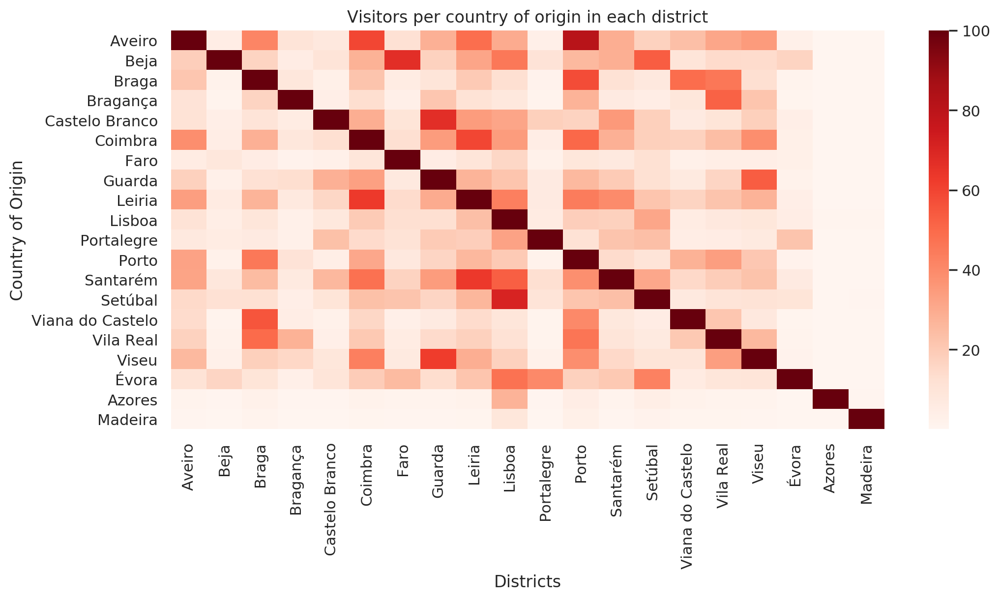

In [132]:
df = pd.read_csv(data_dir+'contingency_table.csv').rename(columns={'Unnamed: 0':'distritos'}).set_index('distritos')

totals=[]

def percent_poi(row):
    total = row[row.name]
    #print(total)
    return (row/total)*100

pv = df.apply(percent_poi, axis=1)

sns.heatmap(pv, cmap='Reds')
plt.title('Visitors per country of origin in each district')
plt.xlabel('Districts')
plt.ylabel('Country of Origin')
#plt.savefig(viz_out+'visitors_per_country_of_origin_per_district.png', format='png', dpi=1200, transparent=True, bbox_inches='tight')
plt.show()
#df.loc['Aveiro'].name
